In [1]:
%matplotlib inline
import pandas as pd
import numpy as np
import re
from matplotlib.ticker import MaxNLocator
import matplotlib.pyplot as plt
from scipy import stats
from folium.plugins import MarkerCluster
import warnings
import folium
import zipfile
from shapely.geometry import Point
from shapely.geometry.polygon import Polygon
import geopandas as gpd
import re

In [3]:
df = pd.read_csv('food-inspections.csv')
per_capita_income = pd.read_csv('Per_Capita_Income.csv')
communities = pd.read_csv('community_names.csv')

#--------------------------Preprocessing------------------------------------#
df["Inspection Date"]= df["Inspection Date"].str.slice(0, -13, 1)
df['Violations'] = df['Violations'].fillna('0')
df['Violation number'] = df['Violations'].apply(lambda x: re.findall(r'^[0-9]+[.] | [|] [0-9]+[.] ', x))
df['Violation number'] = df['Violation number'].apply(lambda x: [int(sub.replace('|','').split('.')[0]) for sub in x])
chicago_boundaries = gpd.read_file('Boundaries_Chicago.geojson')

In [4]:
#----------------------------Helper function---------------------------------#
def most_frequent(List):
    no_zeros = [x for x in List if x != 0]
    if(len(no_zeros)>0):
        return max(set(no_zeros), key = no_zeros.count)
    else:
        return List[0]

In [21]:
#---------------------------Create table of business--------------------------------------#
history_db = df.sort_values("Inspection Date").groupby(['DBA Name', 'Latitude', 'Longitude','Regions'])['Results'].apply(list).reset_index(name='History')
history_db['Dates'] = df.sort_values("Inspection Date").groupby(['DBA Name', 'Latitude', 'Longitude'])['Inspection Date'].apply(list).reset_index(name='Dates')['Dates']
history_db['Risks'] = df.sort_values("Inspection Date").groupby(['DBA Name', 'Latitude', 'Longitude'])['Risk'].apply(list).reset_index(name='Risks')['Risks']
history_db['Violations'] = df.sort_values("Inspection Date").groupby(['DBA Name', 'Latitude', 'Longitude'])['Violations'].apply(list).reset_index(name='Violations')['Violations']
history_db['Violation numbers'] = df.sort_values("Inspection Date").groupby(['DBA Name', 'Latitude', 'Longitude'])['Violation number'].apply(list).reset_index(name='Violation numbers')['Violation numbers']
history_db['Violation numbers'] = history_db['Violation numbers'].apply(lambda x: np.concatenate(x))
history_db['Violation numbers'] = history_db['Violation numbers'].apply(lambda x: np.append(x,[0]) if len(x)==0 else x)
history_db['Violation numbers'] = history_db['Violation numbers'].apply(lambda x: list(x))
history_db['Number of controls'] = history_db['Risks'].map(lambda x: len(x))
history_db['Most frequent violation'] = history_db['Violation numbers'].map(lambda x: most_frequent(x))
history_db['Last Check'] = history_db['History'].map(lambda x: x[-1])

In [22]:
display(history_db.sort_values('Number of controls', ascending = False))

,DBA Name,Latitude,Longitude,Regions,History,Dates,Risks,Violations,Violation numbers,Number of controls,Most frequent violation,Last Check
21998,SPORT SERVICE SOLDIER FIELD,41.862628,-87.615031,Museum Campus,"[Pass, Pass, Pass, Pass, Pass, Pass, Pass, Pas...","[2010-06-07, 2010-06-07, 2010-06-07, 2010-06-0...","[2, 2, 2, 2, 2, 2, 2, 3, 2, 2, 2, 2, 2, 2, 3, ...","[34. FLOORS: CONSTRUCTED PER CODE, CLEANED, GO...","[34.0, 32.0, 34.0, 33.0, 34.0, 34.0, 34.0, 33....",197,34.0,Out of Business
11449,ILLINOIS SPORTSERVICE,41.830784,-87.635296,Armour Square,"[Pass, Pass, Pass w/ Conditions, Pass, Pass, P...","[2010-03-25, 2010-03-25, 2010-03-25, 2010-03-2...","[2, 2, 2, 2, 3, 2, 2, 2, 2, 2, 3, 2, 2, 2, 2, ...","[0, 0, 9. WATER SOURCE: SAFE, HOT & COLD UNDER...","[9.0, 32.0, 33.0, 38.0, 40.0, 2.0, 35.0, 33.0,...",173,38.0,Pass w/ Conditions
22384,STARBUCKS,42.008536,-87.914428,O'Hare,"[Pass, Pass w/ Conditions, Pass, Fail, Pass w/...","[2010-06-25, 2010-07-29, 2010-08-06, 2010-08-2...","[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, ...",[32. FOOD AND NON-FOOD CONTACT SURFACES PROPER...,"[32.0, 33.0, 35.0, 3.0, 32.0, 33.0, 35.0, 32.0...",159,33.0,Pass
15915,MCDONALDS,42.008536,-87.914428,O'Hare,"[Pass, Pass, Pass, Pass, Fail, Fail, Pass, Pas...","[2010-02-02, 2010-02-05, 2010-02-09, 2010-05-0...","[1, 2, 2, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 2, ...","[0, 0, 0, 32. FOOD AND NON-FOOD CONTACT SURFAC...","[32.0, 33.0, 35.0, 18.0, 32.0, 33.0, 34.0, 35....",148,34.0,Pass
14397,LEVY RESTAURANTS,41.947317,-87.656418,Wrigleyville,"[Pass, Pass, Pass, Pass, Pass, Pass, Pass, Pas...","[2010-04-05, 2010-04-05, 2010-04-05, 2010-04-0...","[2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 2, 2, 2, 2, ...",[32. FOOD AND NON-FOOD CONTACT SURFACES PROPER...,"[32.0, 38.0, 38.0, 29.0, 18.0, 32.0, 33.0, 38....",148,34.0,Pass
11149,HOST INTERNATIONAL,42.008536,-87.914428,O'Hare,"[Pass w/ Conditions, Fail, Pass, Pass, Pass, P...","[2010-02-09, 2010-03-15, 2010-04-08, 2010-05-1...","[1, 3, 3, 2, 1, 2, 2, 2, 2, 2, 2, 3, 1, 3, 2, ...",[2. FACILITIES TO MAINTAIN PROPER TEMPERATURE ...,"[2.0, 32.0, 33.0, 36.0, 18.0, 32.0, 33.0, 35.0...",114,33.0,Pass
24399,THE GREAT AMERICAN BAGEL,42.008536,-87.914428,O'Hare,"[Fail, Pass, Pass, Pass, Pass, Pass, Pass, Pas...","[2010-01-05, 2010-01-06, 2010-01-06, 2010-06-1...","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, ...","[9. WATER SOURCE: SAFE, HOT & COLD UNDER CITY ...","[9.0, 32.0, 33.0, 35.0, 36.0, 30.0, 32.0, 32.0...",92,35.0,Pass
15159,MACYS,41.883473,-87.627730,Loop,"[Pass, Pass, Pass, Pass, Pass, Pass, Pass, Pas...","[2010-03-22, 2010-09-15, 2010-09-15, 2010-09-1...","[1, 1, 1, 2, 1, 1, 1, 1, 1, 2, 1, 1, 2, 1, 1, ...","[30. FOOD IN ORIGINAL CONTAINER, PROPERLY LABE...","[30.0, 33.0, 35.0, 33.0, 32.0, 33.0, 35.0, 33....",87,34.0,Pass w/ Conditions
25330,TRIPLE A SERVICES,41.844671,-87.654962,Bridgeport,"[Fail, Fail, Pass, Pass, Pass, Pass, Pass, Pas...","[2010-01-26, 2010-01-27, 2010-01-27, 2010-01-2...","[3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, ...",[18. NO EVIDENCE OF RODENT OR INSECT OUTER OPE...,"[18.0, 20.0, 30.0, 32.0, 33.0, 34.0, 35.0, 36....",74,38.0,Pass
19973,REGGIOS PIZZA EXPRESS,42.008536,-87.914428,O'Hare,"[Pass, Pass, Pass, Pass, Pass w/ Conditions, P...","[2010-01-05, 2010-12-20, 2010-12-20, 2011-01-1...","[1, 2, 1, 1, 1, 1, 2, 1, 1, 1, 1, 2, 1, 1, 1, ...",[32. FOOD AND NON-FOOD CONTACT SURFACES PROPER...,"[32.0, 33.0, 34.0, 35.0, 41.0, 32.0, 33.0, 35....",72,33.0,Pass w/ Conditions


In [23]:
#------------------Out of business--------------------------------------#
oob_history_db = (history_db[history_db.History.apply(lambda x: 'Out of Business' in x)])
oob_history_db = oob_history_db[oob_history_db['Last Check']=='Out of Business']

#------------------Not Out of business--------------------------------------#
noob_history_db = (history_db[history_db.History.apply(lambda x: 'Out of Business' not in x)])

In [20]:
for x in history_db['Violation numbers']:
    print(type(x))

<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.nd

<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.nd

<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.nd

<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.nd

<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.nd

<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.nd

<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.nd

<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.nd

<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.nd

<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.nd

<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.nd

<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.nd

<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.nd

<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.nd

<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.nd

In [24]:
#oob_history_db['Violation numbers']
violations_counts_all = [x for x in history_db['Violation numbers'].sum() if x != 0]
violations_counts_oob = [x for x in oob_history_db['Violation numbers'].sum() if x != 0]
violations_counts_noob = [x for x in noob_history_db['Violation numbers'].sum() if x != 0]

#------------------Max violations counts--------------------------------#
max_violations_counts_all = [x for x in history_db['Most frequent violation'].values if x != 0]
max_violations_counts_oob = [x for x in oob_history_db['Most frequent violation'].values if x != 0]
max_violations_counts_noob = [x for x in noob_history_db['Most frequent violation'].values if x != 0]

32.0

32.0

34.0

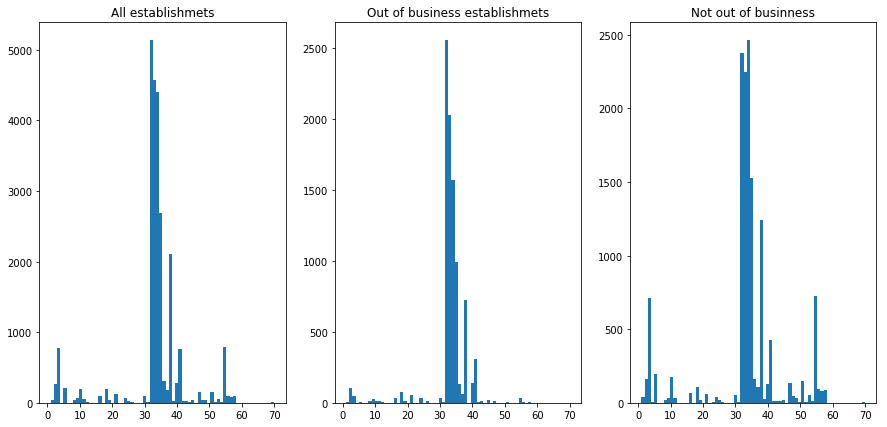

In [25]:
#-------------------------Plot max violations counts------------------------#
fig, ax = plt.subplots(1,3, figsize = (15,7))
ax[0].hist(max_violations_counts_all, bins=70)
ax[0].title.set_text('All establishmets')
ax[1].hist(max_violations_counts_oob, bins=70)
ax[1].title.set_text('Out of business establishmets')
ax[2].hist(max_violations_counts_noob, bins=70)
ax[2].title.set_text('Not out of businness')

display(most_frequent(max_violations_counts_all),most_frequent(max_violations_counts_oob), most_frequent(max_violations_counts_noob))
plt.show()

32.0

32.0

34.0

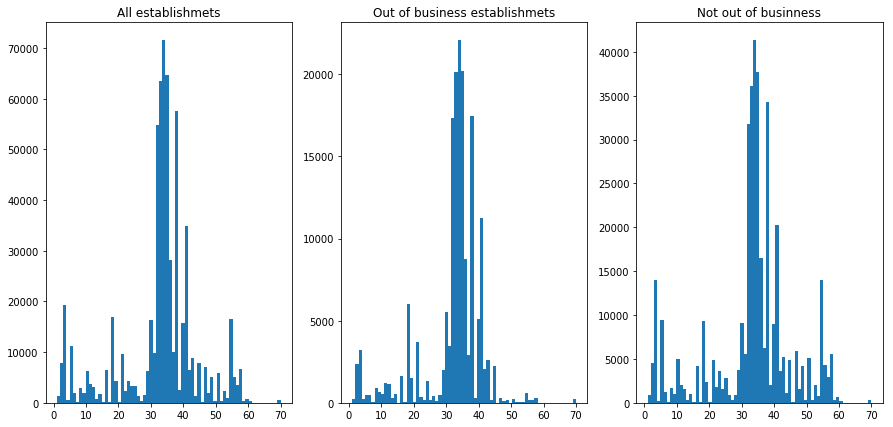

In [26]:
#-------------------------Plot max violations counts------------------------#
fig, ax = plt.subplots(1,3, figsize = (15,7))
ax[0].hist(violations_counts_all, bins=70)
ax[0].title.set_text('All establishmets')
ax[1].hist(violations_counts_oob, bins=70)
ax[1].title.set_text('Out of business establishmets')
ax[2].hist(violations_counts_noob, bins=70)
ax[2].title.set_text('Not out of businness')

display(most_frequent(max_violations_counts_all),most_frequent(max_violations_counts_oob), most_frequent(max_violations_counts_noob))
plt.show()

In [27]:
#-------------------------Plot max violations counts------------------------#
oob_regions = oob_history_db.groupby("Regions").count()['DBA Name'].reset_index()
all_regions = history_db.groupby("Regions").count()['DBA Name'].reset_index()
merged_regions = pd.merge(left = oob_regions, right = all_regions, on='Regions').rename(columns={"DBA Name_x":"Out of Business", "DBA Name_y":"Total"})
merged_regions['Ratio'] = merged_regions['Out of Business'].divide(merged_regions['Total'], fill_value = 1)
merged_regions = merged_regions.sort_values("Ratio",ascending = False) 
display(merged_regions)

,Regions,Out of Business,Total,Ratio
55,Millenium Park,8,14,0.571429
27,Fuller Park,27,53,0.509434
30,Garfield Park,187,376,0.497340
0,Albany Park,258,528,0.488636
45,Lake View,541,1131,0.478338
11,Boystown,44,92,0.478261
29,Galewood,36,77,0.467532
56,Montclare,38,82,0.463415
22,East Side,53,115,0.460870
5,Auburn Gresham,178,388,0.458763


In [28]:
list_worst = ['Riverdale','Englewood', 'Washington Park', 'Fuller Park','West Englewood','Burnside','South Deering', 'Pullman','South Chicago','Grand Crossing']
display(merged_regions[merged_regions['Regions'].isin(list_worst)])

,Regions,Out of Business,Total,Ratio
27,Fuller Park,27,53,0.509434
87,Washington Park,40,91,0.439560
73,Riverdale,12,28,0.428571
26,Englewood,215,520,0.413462
34,Grand Crossing,139,356,0.390449
80,South Deering,40,111,0.360360
79,South Chicago,83,233,0.356223
71,Pullman,17,52,0.326923


In [29]:
map_regions_ratio = folium.Map(
    location=[41.8781, -87.6298],
    zoom_start=9
)

#Group by regions and count number of occurencies
map_merged_regions = merged_regions[['Regions', 'Ratio']]
map_merged_regions.columns = ['pri_neigh', 'Ratio']

#Add regions to the map
choropleth = folium.Choropleth(
    geo_data='Boundaries_Chicago.geojson',
    name='choropleth',
    data=map_merged_regions,
    columns=['pri_neigh', 'Ratio'],
    key_on='feature.properties.pri_neigh',
    fill_color='BuPu',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Out of business Ratio'
).add_to(map_regions_ratio)

choropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(['pri_neigh'], labels=False)
)
map_regions_ratio

In [30]:
display(per_capita_income)

,Community Area Number,COMMUNITY AREA NAME,PERCENT OF HOUSING CROWDED,PERCENT HOUSEHOLDS BELOW POVERTY,PERCENT AGED 16+ UNEMPLOYED,PERCENT AGED 25+ WITHOUT HIGH SCHOOL DIPLOMA,PERCENT AGED UNDER 18 OR OVER 64,PER CAPITA INCOME,HARDSHIP INDEX
0,1.0,Rogers Park,7.7,23.6,8.7,18.2,27.5,23939,39.0
1,2.0,West Ridge,7.8,17.2,8.8,20.8,38.5,23040,46.0
2,3.0,Uptown,3.8,24.0,8.9,11.8,22.2,35787,20.0
3,4.0,Lincoln Square,3.4,10.9,8.2,13.4,25.5,37524,17.0
4,5.0,North Center,0.3,7.5,5.2,4.5,26.2,57123,6.0
5,6.0,Lake View,1.1,11.4,4.7,2.6,17.0,60058,5.0
6,7.0,Lincoln Park,0.8,12.3,5.1,3.6,21.5,71551,2.0
7,8.0,Near North Side,1.9,12.9,7.0,2.5,22.6,88669,1.0
8,9.0,Edison Park,1.1,3.3,6.5,7.4,35.3,40959,8.0
9,10.0,Norwood Park,2.0,5.4,9.0,11.5,39.5,32875,21.0


In [ ]:
communities['pri_negh'] = [None] * communities.shape[0]
regions = chicago_boundaries['pri_neigh'].unique()

for index, row in communities.iterrows():
    if row['Neighborhood'] in regions:
        communities.at[index, 'pri_negh'] = row['Neighborhood']
    elif row['Community area'] in regions:
        communities.at[index, 'pri_negh'] = row['Community area']
    elif "Garfield Park" in row['Community area'] or "Garfield Park" in row['Neighborhood']:
        communities.at[index, 'pri_negh'] = "Garfield Park"
    elif "Little Italy" in row['Community area'] or "Little Italy" in row['Neighborhood']:
        communities.at[index, 'pri_negh'] = "Little Italy, UIC"
    elif "Printer" in row['Community area'] or "Printer" in row['Neighborhood']:
        communities.at[index, 'pri_negh'] = "Printers Row"
    elif "Loop" in row['Community area'] or "Loop" in row['Neighborhood']:
        communities.at[index, 'pri_negh'] = "Loop"

display(set(regions) - set(communities['pri_negh']))
display(communities[communities['pri_negh'].isnull()])

In [31]:
capita_income_full = pd.merge(left = per_capita_income, right = communities, left_on='COMMUNITY AREA NAME', right_on = 'Community area', how = 'inner')
display(capita_income_full)
#merged_regions = pd.merge(left = oob_regions, right = all_regions, on='Regions').rename(columns={"DBA Name_x":"Out of Business", "DBA Name_y":"Total"})

,Community Area Number,COMMUNITY AREA NAME,PERCENT OF HOUSING CROWDED,PERCENT HOUSEHOLDS BELOW POVERTY,PERCENT AGED 16+ UNEMPLOYED,PERCENT AGED 25+ WITHOUT HIGH SCHOOL DIPLOMA,PERCENT AGED UNDER 18 OR OVER 64,PER CAPITA INCOME,HARDSHIP INDEX,Neighborhood,Community area
0,1.0,Rogers Park,7.7,23.6,8.7,18.2,27.5,23939,39.0,Loyola,Rogers Park
1,1.0,Rogers Park,7.7,23.6,8.7,18.2,27.5,23939,39.0,Rogers Park,Rogers Park
2,2.0,West Ridge,7.8,17.2,8.8,20.8,38.5,23040,46.0,Nortown,West Ridge
3,2.0,West Ridge,7.8,17.2,8.8,20.8,38.5,23040,46.0,Peterson Park,West Ridge
4,2.0,West Ridge,7.8,17.2,8.8,20.8,38.5,23040,46.0,Rosehill,West Ridge
5,2.0,West Ridge,7.8,17.2,8.8,20.8,38.5,23040,46.0,West Ridge,West Ridge
6,2.0,West Ridge,7.8,17.2,8.8,20.8,38.5,23040,46.0,West Rogers Park,West Ridge
7,3.0,Uptown,3.8,24.0,8.9,11.8,22.2,35787,20.0,Buena Park,Uptown
8,3.0,Uptown,3.8,24.0,8.9,11.8,22.2,35787,20.0,Clarendon Park,Uptown
9,3.0,Uptown,3.8,24.0,8.9,11.8,22.2,35787,20.0,Margate Park,Uptown


In [32]:
map_regions_income = folium.Map(
    location=[41.8781, -87.6298],
    zoom_start=9
)

#Group by regions and count number of occurencies
regions_income = per_capita_income[['COMMUNITY AREA NAME', 'PER CAPITA INCOME ']]
regions_income.columns = ['pri_neigh', 'Income']

#Add regions to the map
choropleth = folium.Choropleth(
    geo_data='Boundaries_Chicago.geojson',
    name='choropleth',
    data=regions_income,
    columns=['pri_neigh', 'Income'],
    key_on='feature.properties.pri_neigh',
    fill_color='BuPu',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Per capita Income'
).add_to(map_regions_income)

choropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(['pri_neigh'], labels=False)
)
map_regions_income

In [38]:
# Map the facilities that have gone out of business 
map_oob = folium.Map(
    location=[41.8781, -87.6298],
    zoom_start=9
)

marker_cluster = MarkerCluster().add_to(map_oob)
ranges = 0
for index,row in oob_history_db.iterrows():
    folium.Marker([(row['Latitude']), (row['Longitude'])]).add_to(marker_cluster)        
    ranges = ranges + 1

map_oob

In [41]:
map_regions = folium.Map(
    location=[41.8781, -87.6298],
    zoom_start=9
)

#Group by regions and count number of occurencies
regions_oob = oob_history_db.groupby("Regions").count()[['DBA Name']]
regions_oob.reset_index(level=0, inplace=True)
regions_oob.columns = ['pri_neigh', 'count']

#Add regions to the map
choropleth = folium.Choropleth(
    geo_data='Boundaries_Chicago.geojson',
    name='choropleth',
    data=regions_oob,
    columns=['pri_neigh', 'count'],
    key_on='feature.properties.pri_neigh',
    fill_color='YlGn',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Out of business amount'
).add_to(map_regions)

choropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(['pri_neigh'], labels=False)
)
display(map_regions)

del regions_oob

In [42]:
map_regions_all = folium.Map(
    location=[41.8781, -87.6298],
    zoom_start=9
)

#Group by regions and count number of occurencies
regions_all = history_db.groupby("Regions").count()[['DBA Name']]
regions_all.reset_index(level=0, inplace=True)
regions_all.columns = ['pri_neigh', 'count']

#Add regions to the map
choropleth = folium.Choropleth(
    geo_data='Boundaries_Chicago.geojson',
    name='choropleth',
    data=regions_all,
    columns=['pri_neigh', 'count'],
    key_on='feature.properties.pri_neigh',
    fill_color='YlGn',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Count of inspections in a region'
).add_to(map_regions_all)

choropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(['pri_neigh'], labels=False)
)
map_regions_all